객체 인식 YOLO 활용 - 마스크 착용 상태 파악
---

## 0. 환경 구성
### yolov5를 사용하기 위한 환경을 구성합니다.
- ultralytics 설치
- yolov5 다운로드
- 모델 사용을 위한 라이브러리, 패키지 설치

라이브러리 정보는 yolov5에서 제공하는 requirements.txt 파일을 사용하였습니다. 주요 라이브러리 버전은 다음과 같습니다.

1.	matplotlib>=3.3
2.	numpy>=1.23.5
3.	opencv-python>=4.1.1
4.	pillow>=10.3.0
5.	PyYAML>=5.3.1
6.	requests>=2.32.0
7.	scipy>=1.4.1
8.	thop>=0.1.1 
9.	torch>=1.8.0 
10.	torchvision>=0.9.0
11.	tqdm>=4.64.0
12.	ultralytics>=8.2.34 
13.	pandas>=1.1.4
14.	sea

파이썬은 3.11.5를 사용하였습니다.born>=0.11.0


In [1]:
#yolov5 사용을 위한 ultralytics 설치
!pip install ultralytics

In [2]:
#yolov5 git에서 다운로드
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16634, done.
remote: Counting objects: 100% (175/175), done.
remote: Compressing objects: 100% (128/128), done.
remote: Total 16634 (delta 70), reused 106 (delta 47), pack-reused 16459
Receiving objects: 100% (16634/16634), 15.34 MiB | 6.76 MiB/s, done.
Resolving deltas: 100% (11369/11369), done.


In [3]:
#다운받은 yolov5 디렉토리로 이동
cd yolov5

/home/students/cs/kk21/ml/final/yolov5


In [4]:
#현재 디렉토리 확인
pwd

'/home/students/cs/kk21/ml/final/yolov5'

In [5]:
#모델 사용을 위한 라이브러리, 패키지 설치
!pip install -r requirements.txt

In [96]:
#torch 설치
!pip install torch

In [364]:
#그래프 출력을 위한 import
import matplotlib.image as img
import matplotlib.pyplot as plt
#jupyter notebook에서 plot 결과 보기 위한 inline 실행
%matplotlib inline
#기본 import
import torch
import yaml
from yolov5.models.common import DetectMultiBackend
import warnings
warnings.filterwarnings('ignore')
import os
import torch
import cv2

---
## 1. 데이터 사용 준비
### 데이터 사용을 하기 위해 압축을 해제하고 데이터를 분할하는 작업을 진행합니다.
- 데이터 압축 해제
- 데이터를 train, valid, test로 분할하는데 비율은 6:2:2
- 폴더를 만들고 각 폴더 아래에 복사
- 데이터 분할 후 각 데이터 개수 확인
- 각 데이터를 이미지와 라벨로 분할
- 모델에 사용하기 윈한 data.yaml 파일 생성

In [6]:
#데이터 사용을 위한 압축 해제
import zipfile
import os

# zip 파일 경로
zip_file_path = './../face_mask.zip'
# 현재 디렉토리 아래에 압축 해제
unzip_dir = './../'

# 압축 해제
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(unzip_dir)

In [7]:
#데이터 분할(train, valid, test로 분할)
import os
from glob import glob 
import shutil
from sklearn.model_selection import train_test_split

#이미지 경로
image_files = glob("./../face_mask/*.png")

images = [name.replace(".png", '') for name in image_files]

#데이터 분할
#train:val:test = 6:2:2

#train과 test로 분할
train_names, test_names = train_test_split(images, test_size = 0.4, random_state = 42, shuffle = True)
#valid와 test로 분할
val_names, test_names = train_test_split(test_names, test_size = 0.5, random_state = 42, shuffle = True)

#복사 함수
def batch_move_files(file_list, source_path, destination_path):
    for file in file_list:
        # 경로에서 마지막 파일명만 가져와서 확장자 붙여줌
        image = file.split('/')[-1] + ".png"
        txt = file.split('/')[-1] +'.txt'
        shutil.copy(os.path.join(source_path, image), destination_path)
        shutil.copy(os.path.join(source_path, txt), destination_path)
    return

#원본 데이터 경로
source_dir="./../face_mask"

#폴더 만들기
os.makedirs('./../data', exist_ok=True)
os.makedirs('./../data/train', exist_ok=True)
os.makedirs('./../data/test', exist_ok=True)
os.makedirs('./../data/valid', exist_ok=True)

#폴더 경로 지정
train_dir = "./../data/train"
test_dir = "./../data/test"
val_dir = "./../data/valid"

#분할
batch_move_files(train_names, source_dir, train_dir)
batch_move_files(test_names, source_dir, test_dir)
batch_move_files(val_names, source_dir, val_dir)

In [8]:
#데이터 전체 개수
print("전체 데이터 개수")
!ls ../face_mask | wc -l

전체 데이터 개수
1602


In [9]:
#train 데이터 개수 960개
print("train 데이터 개수")
!ls ../data/train | wc -l

train 데이터 개수
960


In [10]:
#valid 데이터 개수 320개
print("valid 데이터 개수")
!ls ../data/valid | wc -l

valid 데이터 개수
320


In [11]:
#test 데이터 개수 320개
print("test 데이터 개수")
!ls ../data/test | wc -l

test 데이터 개수
322


In [12]:
#train 데이터 이미지 라벨 분할
import os
import shutil

# 원본 폴더 경로
source_dir = './../data/train'

#이미지 라벨 각 폴더 생성
os.makedirs('./../data/train/images', exist_ok=True)
os.makedirs('./../data/train/labels', exist_ok=True)

# 이미지와 라벨 파일을 저장할 폴더 경로
image_dir = './../data/train/images'
label_dir = './../data/train/labels'

# 폴더가 없으면 생성
os.makedirs(image_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# 파일 이동
for filename in os.listdir(source_dir):
    if filename.endswith('.png'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(image_dir, filename))
    elif filename.endswith('.txt'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(label_dir, filename))

print("train 데이터 이미지, 라벨 분할 완료")

train 데이터 이미지, 라벨 분할 완료


In [13]:
#valid 데이터 이미지 라벨 분할
import os
import shutil

# 원본 폴더 경로
source_dir = './../data/valid'

#이미지 라벨 각 폴더 생성
os.makedirs('./../data/valid/images', exist_ok=True)
os.makedirs('./../data/valid/labels', exist_ok=True)

# 이미지와 라벨 파일을 저장할 폴더 경로
image_dir = './../data/valid/images'
label_dir = './../data/valid/labels'

# 폴더가 없으면 생성
os.makedirs(image_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# 파일 이동
for filename in os.listdir(source_dir):
    if filename.endswith('.png'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(image_dir, filename))
    elif filename.endswith('.txt'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(label_dir, filename))

print("valid 데이터 이미지, 라벨 분할 완료")

valid 데이터 이미지, 라벨 분할 완료


In [14]:
#test 데이터 이미지 라벨 분할
import os
import shutil

# 원본 폴더 경로
source_dir = './../data/test'

#이미지 라벨 각 폴더 생성
os.makedirs('./../data/test/images', exist_ok=True)
os.makedirs('./../data/test/labels', exist_ok=True)

# 이미지와 라벨 파일을 저장할 폴더 경로
image_dir = './../data/test/images'
label_dir = './../data/test/labels'

# 폴더가 없으면 생성
os.makedirs(image_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# 파일 이동
for filename in os.listdir(source_dir):
    if filename.endswith('.png'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(image_dir, filename))
    elif filename.endswith('.txt'):
        shutil.move(os.path.join(source_dir, filename), os.path.join(label_dir, filename))

print("test 데이터 이미지, 라벨 분할 완료")

test 데이터 이미지, 라벨 분할 완료


In [15]:
# 파일 경로 설정
yaml_path = os.path.join(os.path.abspath('./../data'), 'data.yaml')

# 파일 내용 설정
yaml_content = """train: ../data/train/images
val: ../data/valid/images
test: ../data/test/images

nc: 3
names:
    0: 'good_mask'
    1: 'no mask'
    2: 'wrong mask'"""

# 디렉토리 생성
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

# YAML 파일 생성
with open(yaml_path, 'w') as file:
    file.write(yaml_content)

print("data.yaml 생성 완료")

data.yaml 생성 완료


---
## 2. 모델 훈련 진행
### 데이터셋을 활용하여 모델 훈련을 진행합니다.
- 하이퍼파라미터 튜닝 진행
- 훈련 과정에서 변화를 확인
- mAP@0.5를 기준으로 최적의 모델 선택

---
#### # 2-1. batch size 16, epochs 100으로 학습 진행
- 1번 모델

In [17]:
#batch 16, epochs 100으로 훈련
!python train.py --img 640 --batch 16 --epochs 100 --data './../data/data.yaml' --weights 'yolov5s.pt'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1

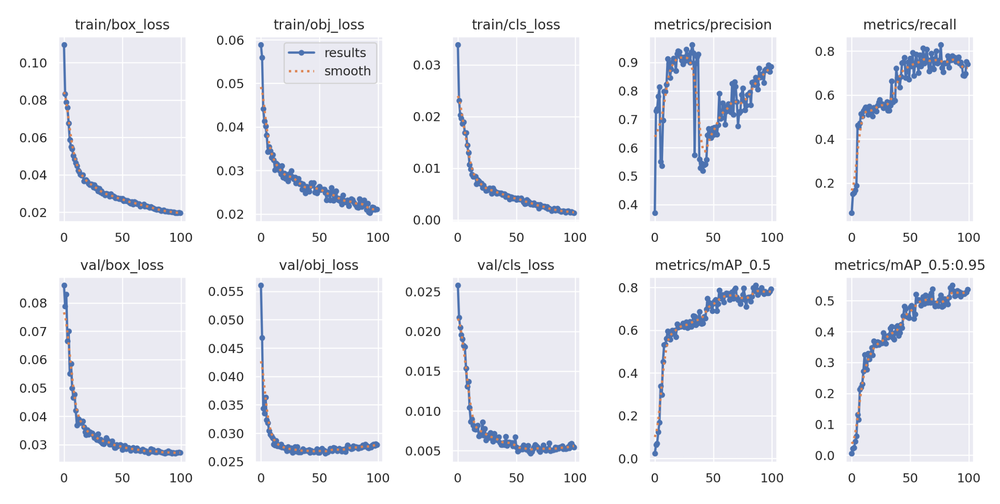

In [340]:
#모델 변화 그래프 확인
plt.figure(figsize=(30,30))
image = img.imread('./runs/train/exp/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : 값이 모두 감소하고 있는 것을 보아 학습이 잘 진행되고 있음을 알 수 있습니다. 
2. 정밀도 : 0.9에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다.
3. 재현율 : 0.8에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다. 
4. mAP_0.5 : 0.8에 가까운 값으로 모델이 전반적으로 높은 예측 성능을 가지고 있음을 알 수 있습니다.

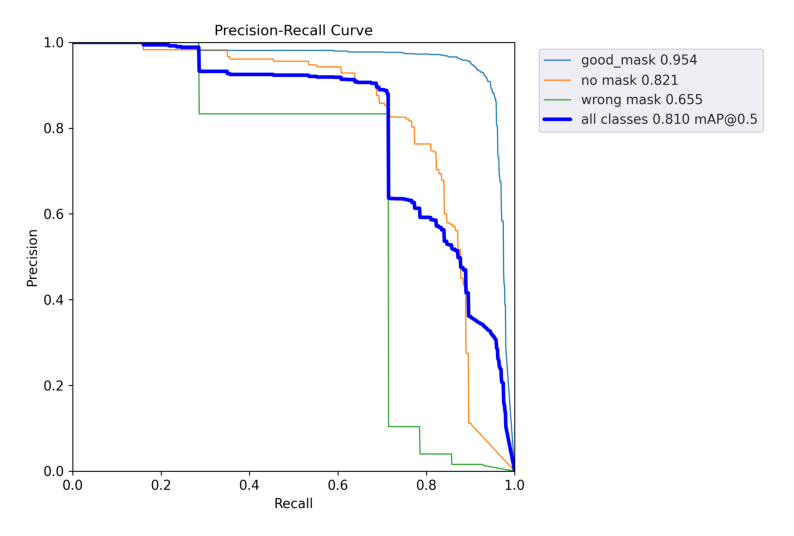

In [343]:
#map@50 확인
plt.figure(figsize=(10,10))
image = img.imread('./runs/train/exp/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.810임을 알 수 있습니다.
- 모델의 성능이 0.81로 높은 수치를 갖고 있어 1번 모델의 성능이 좋다고 판단할 수 있습니다.

---
#### # 2-2. batch size 16, epochs 300으로 학습 진행
- 2번 모델

In [47]:
#batch 16, epochs 300으로 훈련
!python train.py --img 640 --batch 16 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1

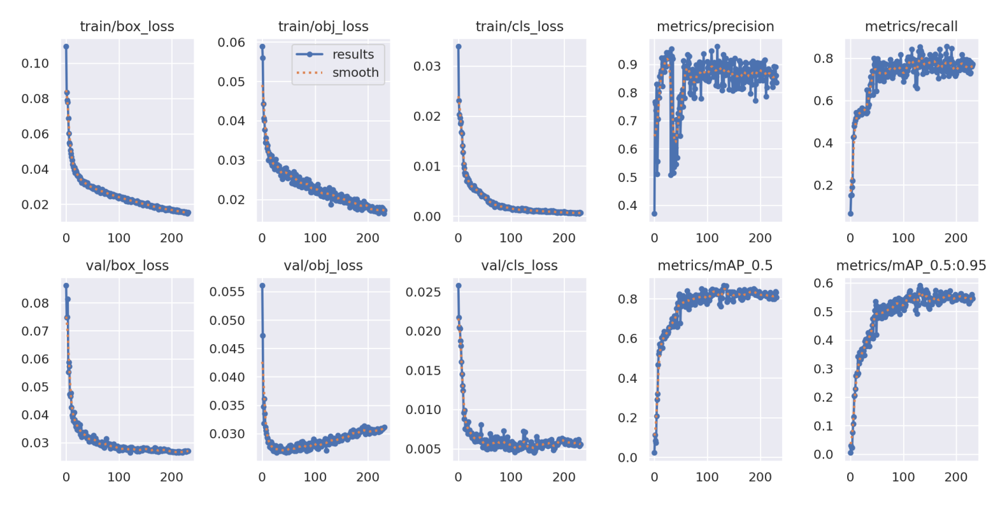

In [345]:
#모델 변화 그래프 확인
plt.figure(figsize=(20,20))
image = img.imread('./runs/train/exp2/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : 값이 모두 감소하고 있는 것을 보아 학습이 잘 진행되고 있음을 알 수 있습니다. 
2. 정밀도 : 초반에는 변동이 크지만, 0.9에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다.
3. 재현율 : 0.8에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다. 
4. mAP_0.5 : 0.8 이상의 값으로 모델이 전반적으로 높은 예측 성능을 가지고 있음을 알 수 있습니다.

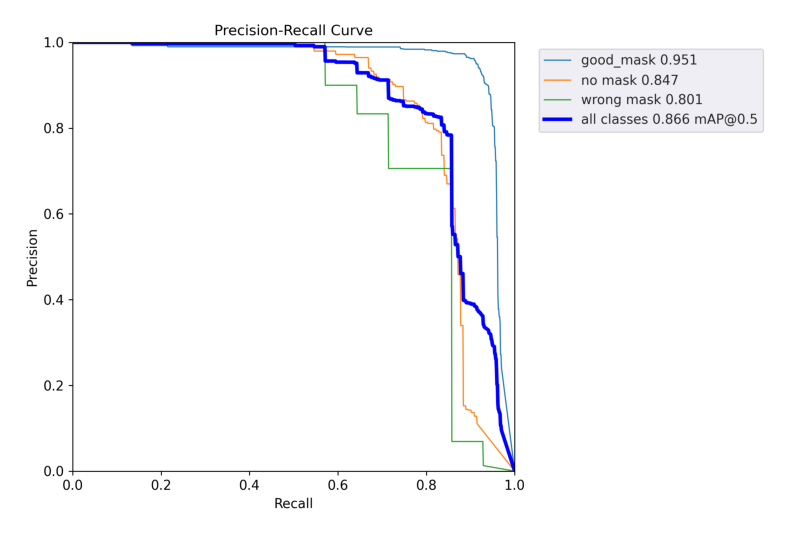

In [346]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp2/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.860임을 알 수 있습니다.
- 모델의 성능이 0.86으로 높은 수치를 갖고 있어 2번 모델의 성능이 좋다고 판단할 수 있습니다.
- 1번 모델보다 높은 점수를 갖고 있어 현재 최적의 모델은 2번 모델입니다.

---
#### # 2-3. batch size 32, epochs 300으로 학습 진행
- 3번 모델

In [63]:
#batch 36, epochs 300으로 훈련
!python train.py --img 640 --batch 32 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1

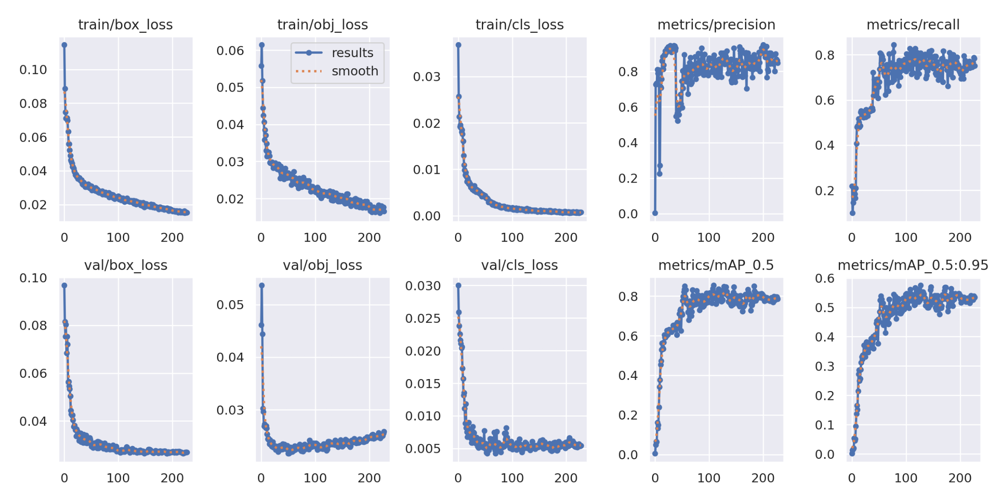

In [348]:
#그래프 확인
plt.figure(figsize=(30,30))
image = img.imread('./runs/train/exp3/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : 값이 모두 감소하고 있는 것을 보아 학습이 잘 진행되고 있음을 알 수 있습니다. 
2. 정밀도 : 0.8 이상의 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다.
3. 재현율 : 0.8에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다. 
4. mAP_0.5 : 0.8에 가까운 값으로 모델이 전반적으로 높은 예측 성능을 가지고 있음을 알 수 있습니다.

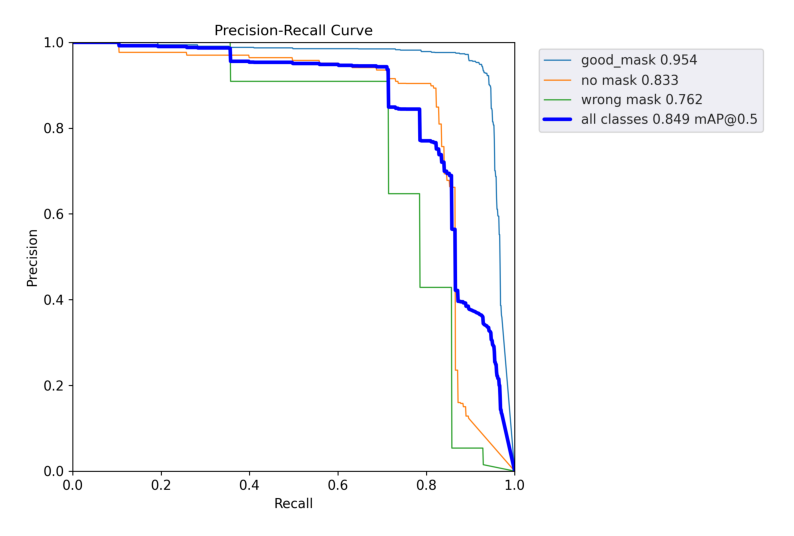

In [349]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp3/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.849임을 알 수 있습니다.
- 모델의 성능이 0.849로 높은 수치를 갖고 있어 3번 모델의 성능이 좋다고 판단할 수 있습니다.
- 그러나, 2번 모델의 수치가 0.86이었기 때문에 현재 최적의 모델은 2번 모델입니다.

---
#### # 2-4. batch size 8, epochs 300으로 학습 진행
- 4번 모델

In [68]:
#batch 8, epochs 300으로 훈련
!python train.py --img 640 --batch 8 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.

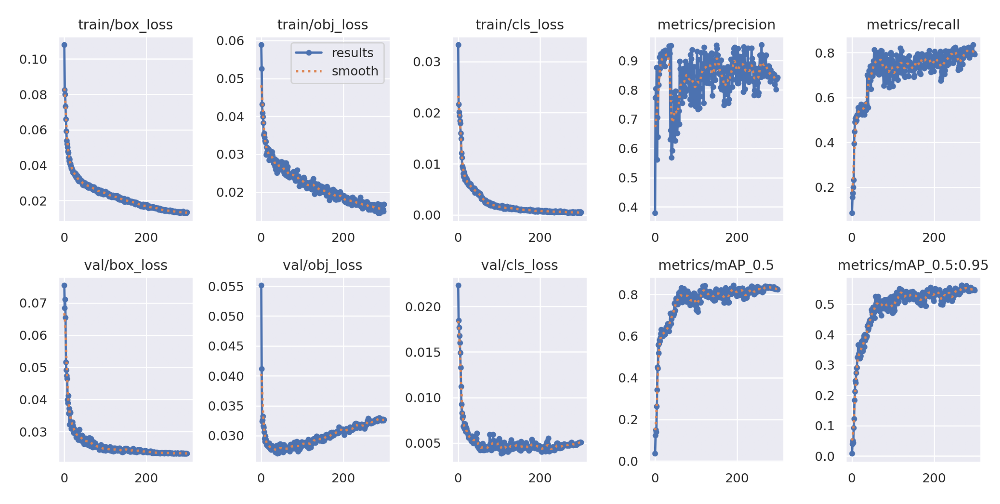

In [350]:
#그래프 확인
plt.figure(figsize=(30,30))
image = img.imread('./runs/train/exp4/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : 값이 모두 감소하고 있는 것을 보아 학습이 잘 진행되고 있음을 알 수 있습니다. 
2. 정밀도 : 변동을 보이기는 하지만, 0.9에 가까운 값이 되었다가 0.8에 가까운 값으로 끝난 것을 볼 수 있습니다. 그러나 0.8 또한 높은 수치이기 때문에 모델이 클래스를 잘 구분한다고 볼 수 있습니다.
3. 재현율 : 0.8에 가까운 값으로 모델이 클래스를 잘 구분하고 있음을 알 수 있습니다. 
4. mAP_0.5 : 0.8 이상의 값으로 모델이 전반적으로 높은 예측 성능을 가지고 있음을 알 수 있습니다.

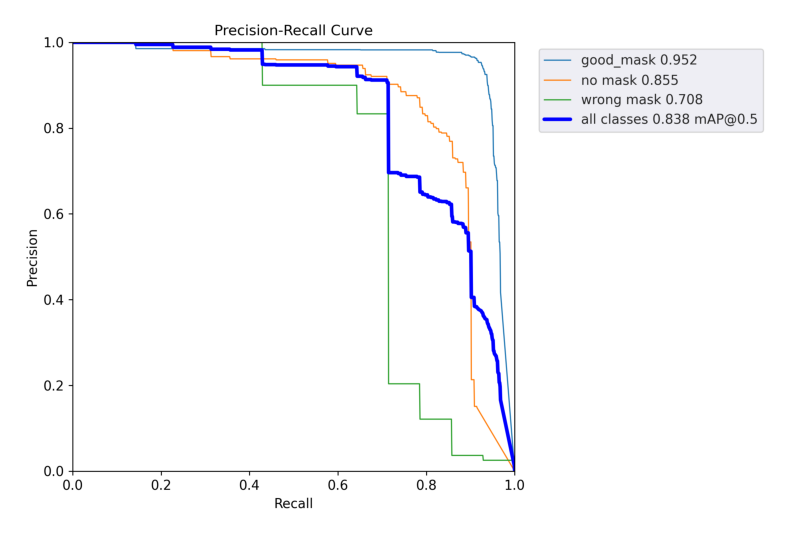

In [351]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp4/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.838임을 알 수 있습니다.
- 모델의 성능이 0.838로 높은 수치를 갖고 있어 4번 모델의 성능이 좋다고 판단할 수 있습니다.
- 그러나 2번 모델의 수치가 0.86이었기 때문에 현재 최적의 모델은 2번 모델입니다.

---
#### # 2-5. batch size 16, epochs 100, learning rate 0.1로 학습 진행
- 5번 모델
- Learning rate는 yaml 파일에서 변경을 해야 하기때문에 yaml 파일 생성을 합니다.
- 5번 모델에는 learning rate를 0.1으로 설정합니다.
- 처음 learning rate와 끝 learning rate를 설정해야 하는데 이번에는 두 개를 모두 동일하게 0.1로 설정합니다.

In [76]:
#lr 0.1인 yaml 파일 생성

# 파일 경로 설정
yaml_path = os.path.join(os.path.abspath('./data/hyps'), 'custom_lr_01.yaml')

# 파일 내용 설정
yaml_content = """lr0: 0.1 # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1 # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937 # SGD momentum/Adam beta1
weight_decay: 0.0005 # optimizer weight decay 5e-4
warmup_epochs: 3.0 # warmup epochs (fractions ok)
warmup_momentum: 0.8 # warmup initial momentum
warmup_bias_lr: 0.1 # warmup initial bias lr
box: 0.05 # box loss gain
cls: 0.3 # cls loss gain
cls_pw: 1.0 # cls BCELoss positive_weight
obj: 0.7 # obj loss gain (scale with pixels)
obj_pw: 1.0 # obj BCELoss positive_weight
iou_t: 0.20 # IoU training threshold
anchor_t: 4.0 # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
# this parameters are all zero since we want to use albumentation framework
fl_gamma: 0.0 # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0 # image HSV-Hue augmentation (fraction)
hsv_s: 0 # image HSV-Saturation augmentation (fraction)
hsv_v: 0 # image HSV-Value augmentation (fraction)
degrees: 0.0 # image rotation (+/- deg)
translate: 0 # image translation (+/- fraction)
scale: 0 # image scale (+/- gain)
shear: 0 # image shear (+/- deg)
perspective: 0.0 # image perspective (+/- fraction), range 0-0.001
flipud: 0.0 # image flip up-down (probability)
fliplr: 0.0 # image flip left-right (probability)
mosaic: 0.0 # image mosaic (probability)
mixup: 0.0 # image mixup (probability)
copy_paste: 0.0 # segment copy-paste (probability)'"""

# 디렉토리 생성
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

# YAML 파일 생성
with open(yaml_path, 'w') as file:
    file.write(yaml_content)

print("leaning rate 0.1인 custom_hyps.yaml 생성 완료")

leaning rate 0.1인 custom_hyps.yaml 생성 완료


### 모델 학습 진행

In [77]:
#batch 16, epochs 300, learning rate 0.1로 훈련
!python train.py --img 640 --batch 16 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt' --hyp './data/hyps/custom_lr_01.yaml'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=./data/hyps/custom_lr_01.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.1, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0,

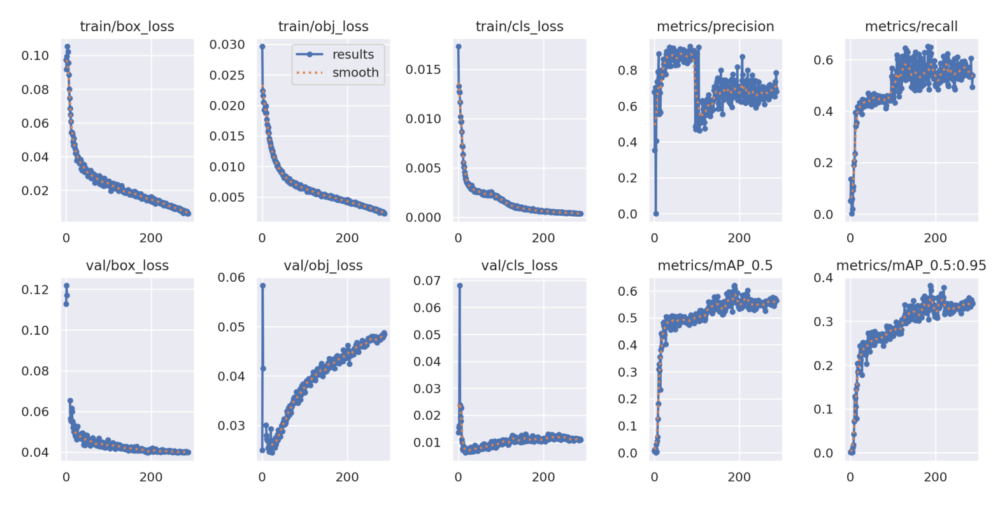

In [353]:
#그래프 확인
plt.figure(figsize=(20, 20))
image = img.imread('./runs/train/exp5/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : train loss는 잘 감소하고 있으나 valid loss는 증가하는 것을 보아 overfitting 일 수 있다는 것을 알 수 있습니다.
2. 정밀도 : 값이 0.8 이상을 유지하다가 0.6 구간으로 떨어진 후 0.6 ~ 0.8 구간에 위치하는 것을 볼 수 있습니다.
3. 재현율 : 0.6에 가까운 값으로 모델이 긍정클래스의 대부분을 잘 구분하고 있다고 볼 수 있습니다. 
4. mAP_0.5 : 0.6에 가까운 값으로 낮은 성능은 아니지만 높은 성능을 가진 모델도 아니라고 볼 수 있습니다. 즉, 중간 정도의 성능을 가진 모델이라고 볼 수 있습니다.

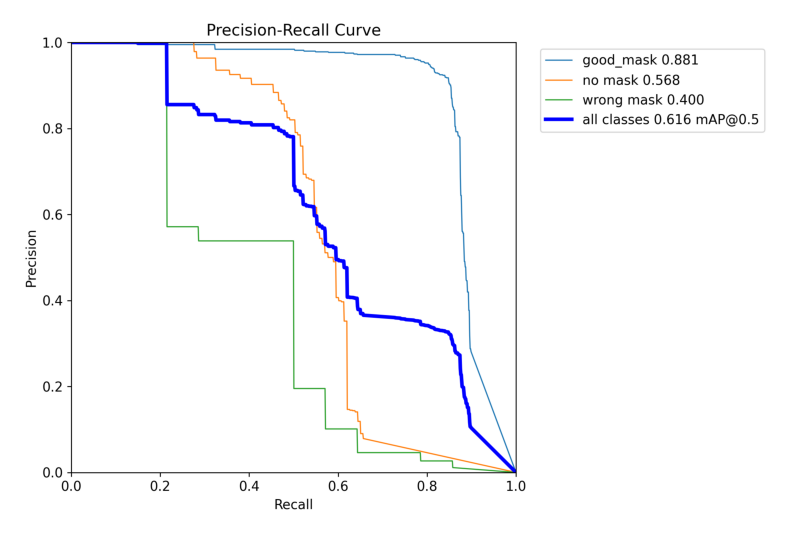

In [354]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp5/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.616임을 알 수 있습니다.
- 모델의 성능이 0.616으로 중간 정도의 수치를 갖고 있어 5번 모델의 성능은 나쁘지도 않지만 좋지도 않은 중간 모델이라고 할 수 있습니다.
- 2번 모델의 수치가 0.86이었기 때문에 현재 최적의 모델은 2번 모델입니다.

---
#### # 2-6. batch size 16, epochs 100, learning rate 0.001로 학습 진행
- 6번 모델
- Learning rate는 yaml 파일에서 변경을 해야 하기때문에 yaml 파일 생성을 합니다.
- 5번 모델에는 learning rate를 0.001으로 설정합니다.
- 처음 learning rate와 끝 learning rate를 설정해야 하는데 이번에는 두 개를 모두 동일하게 0.001로 설정합니다.

In [83]:
#lr 0.001인 yaml 파일 생성

# 파일 경로 설정
yaml_path = os.path.join(os.path.abspath('./data/hyps'), 'custom_lr_0001.yaml')

# 파일 내용 설정
yaml_content = """lr0: 0.001 # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.001 # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937 # SGD momentum/Adam beta1
weight_decay: 0.0005 # optimizer weight decay 5e-4
warmup_epochs: 3.0 # warmup epochs (fractions ok)
warmup_momentum: 0.8 # warmup initial momentum
warmup_bias_lr: 0.1 # warmup initial bias lr
box: 0.05 # box loss gain
cls: 0.3 # cls loss gain
cls_pw: 1.0 # cls BCELoss positive_weight
obj: 0.7 # obj loss gain (scale with pixels)
obj_pw: 1.0 # obj BCELoss positive_weight
iou_t: 0.20 # IoU training threshold
anchor_t: 4.0 # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
# this parameters are all zero since we want to use albumentation framework
fl_gamma: 0.0 # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0 # image HSV-Hue augmentation (fraction)
hsv_s: 0 # image HSV-Saturation augmentation (fraction)
hsv_v: 0 # image HSV-Value augmentation (fraction)
degrees: 0.0 # image rotation (+/- deg)
translate: 0 # image translation (+/- fraction)
scale: 0 # image scale (+/- gain)
shear: 0 # image shear (+/- deg)
perspective: 0.0 # image perspective (+/- fraction), range 0-0.001
flipud: 0.0 # image flip up-down (probability)
fliplr: 0.0 # image flip left-right (probability)
mosaic: 0.0 # image mosaic (probability)
mixup: 0.0 # image mixup (probability)
copy_paste: 0.0 # segment copy-paste (probability)'"""

# 디렉토리 생성
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

# YAML 파일 생성
with open(yaml_path, 'w') as file:
    file.write(yaml_content)

print("leaning rate 0.001인 custom_hyps.yaml 생성 완료")

leaning rate 0.001인 custom_hyps.yaml 생성 완료


### 학습 진행

In [84]:
#batch 16, epochs 300, learning rate 0.001로 훈련
!python train.py --img 640 --batch 16 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt' --hyp './data/hyps/custom_lr_0001.yaml'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=./data/hyps/custom_lr_0001.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.001, lrf=0.001, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_p

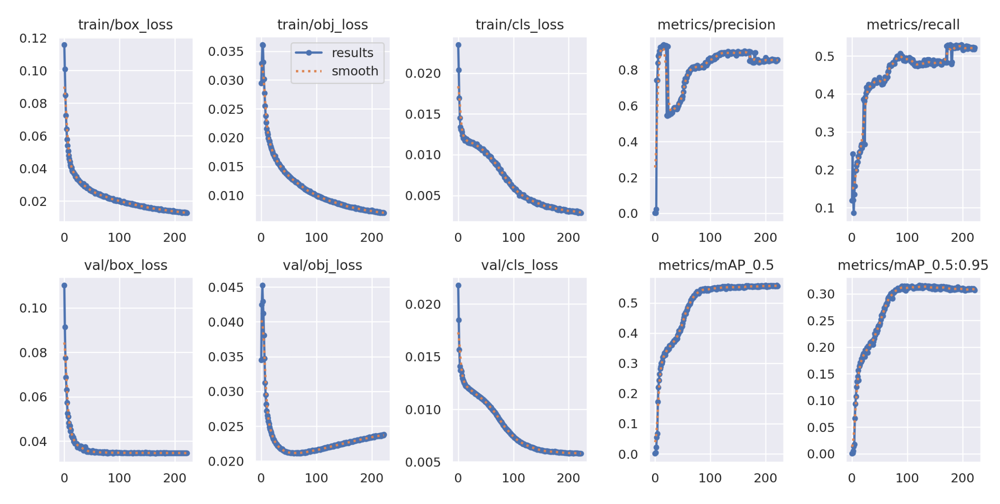

In [85]:
#그래프 확인
import matplotlib.image as img
import matplotlib.pyplot as plt

plt.figure(figsize=(30,30))
image = img.imread('./runs/train/exp6/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : train loss는 잘 감소하고 있습니다. valid loss는 조금 증가하는 것처럼 보이지만 그래도 비교적 잘 감소하고 있습니다.
2. 정밀도 : 값이 0.8 이상의 값으로 모델이 대부분을 잘 구분하고 있다고 볼 수 있습니다. 
3. 재현율 : 0.5 이상의 가까운 값으로 0.6 보다 낮기 때문에 낮은 재현율을 보인다고 볼 수 있습니다.
4. mAP_0.5 : 0.5 ~ 0.6 정도의 값으로 낮은 성능은 아니지만 높은 성능을 가진 모델도 아니라고 볼 수 있습니다. 즉, 중간 정도의 성능을 가진 모델이라고 볼 수 있습니다.

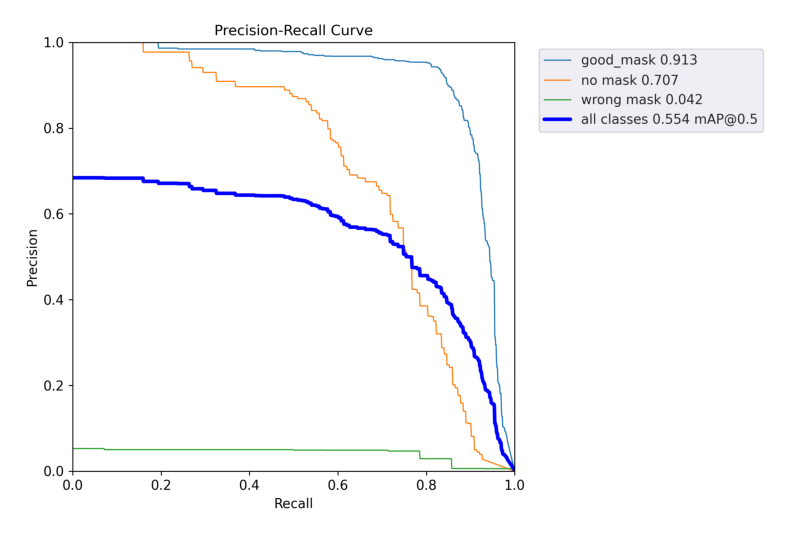

In [355]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp6/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.554임을 알 수 있습니다.
- 모델의 성능이 0.554으로 중간 정도의 수치를 갖고 있어 6번 모델의 성능은 나쁘지도 않지만 좋지도 않은 중간 모델이라고 할 수 있습니다.
- 2번 모델의 수치가 0.86이었기 때문에 현재 최적의 모델은 2번 모델입니다.

---
#### # 2-7. batch size 16, epochs 100, learning rate 0.001 ~ 0.1로 학습 진행
- 7번 모델
- Learning rate는 yaml 파일에서 변경을 해야 하기때문에 yaml 파일 생성을 합니다.
- 7번 모델에는 learning rate를 0.001 ~ 0.01으로 설정합니다.
- 처음 learning rate와 끝 learning rate를 설정해야 하는데 이번에는 시작은 0.001로, 끝은 0.01로 설정합니다.

In [89]:
#lr 0.001 ~ 0.01인 yaml 파일 생성

# 파일 경로 설정
yaml_path = os.path.join(os.path.abspath('./data/hyps'), 'custom_lr.yaml')

# 파일 내용 설정
yaml_content = """lr0: 0.001 # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01 # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937 # SGD momentum/Adam beta1
weight_decay: 0.0005 # optimizer weight decay 5e-4
warmup_epochs: 3.0 # warmup epochs (fractions ok)
warmup_momentum: 0.8 # warmup initial momentum
warmup_bias_lr: 0.1 # warmup initial bias lr
box: 0.05 # box loss gain
cls: 0.3 # cls loss gain
cls_pw: 1.0 # cls BCELoss positive_weight
obj: 0.7 # obj loss gain (scale with pixels)
obj_pw: 1.0 # obj BCELoss positive_weight
iou_t: 0.20 # IoU training threshold
anchor_t: 4.0 # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
# this parameters are all zero since we want to use albumentation framework
fl_gamma: 0.0 # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0 # image HSV-Hue augmentation (fraction)
hsv_s: 0 # image HSV-Saturation augmentation (fraction)
hsv_v: 0 # image HSV-Value augmentation (fraction)
degrees: 0.0 # image rotation (+/- deg)
translate: 0 # image translation (+/- fraction)
scale: 0 # image scale (+/- gain)
shear: 0 # image shear (+/- deg)
perspective: 0.0 # image perspective (+/- fraction), range 0-0.001
flipud: 0.0 # image flip up-down (probability)
fliplr: 0.0 # image flip left-right (probability)
mosaic: 0.0 # image mosaic (probability)
mixup: 0.0 # image mixup (probability)
copy_paste: 0.0 # segment copy-paste (probability)'"""

# 디렉토리 생성
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

# YAML 파일 생성
with open(yaml_path, 'w') as file:
    file.write(yaml_content)

print("leaning rate 0.001 ~ 0.01인 custom_hyps.yaml 생성 완료")

leaning rate 0.001 ~ 0.01인 custom_hyps.yaml 생성 완료


### 모델 훈련

In [90]:
#batch 16, epochs 300, learning rate 0.001 ~ 0.01로 훈련
!python train.py --img 640 --batch 16 --epochs 300 --data './../data/data.yaml' --weights 'yolov5s.pt' --hyp './data/hyps/custom_lr.yaml'

train: weights=yolov5s.pt, cfg=, data=./../data/data.yaml, hyp=./data/hyps/custom_lr.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

hyperparameters: lr0=0.001, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0,

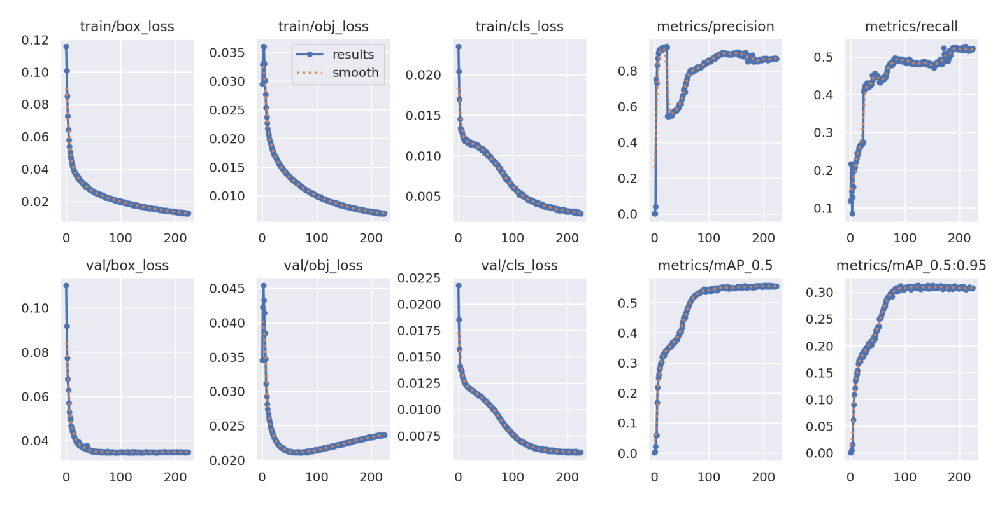

In [358]:
#그래프 확인
plt.figure(figsize=(20, 20))
image = img.imread('./runs/train/exp7/results.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. Loss : train loss는 잘 감소하고 있으나 valid loss는 증가하는 것으로 overfitting 일 수 있다는 것을 알 수 있습니다.
2. 정밀도 : 값이 0.8 이상의 값으로 모델이 긍정클래스의 대부분을 잘 구분하고 있다고 볼 수 있습니다. 
3. 재현율 : 0.5 이상의 가까운 값으로 0.6 보다 낮기 때문에 낮은 재현율을 보인다고 볼 수 있습니다.
4. mAP_0.5 : 0.5 ~0.6에 가까운 값으로 낮은 성능은 아니지만 높은 성능을 가진 모델도 아니라고 볼 수 있습니다. 즉, 중간 정도의 성능을 가진 모델이라고 볼 수 있습니다.

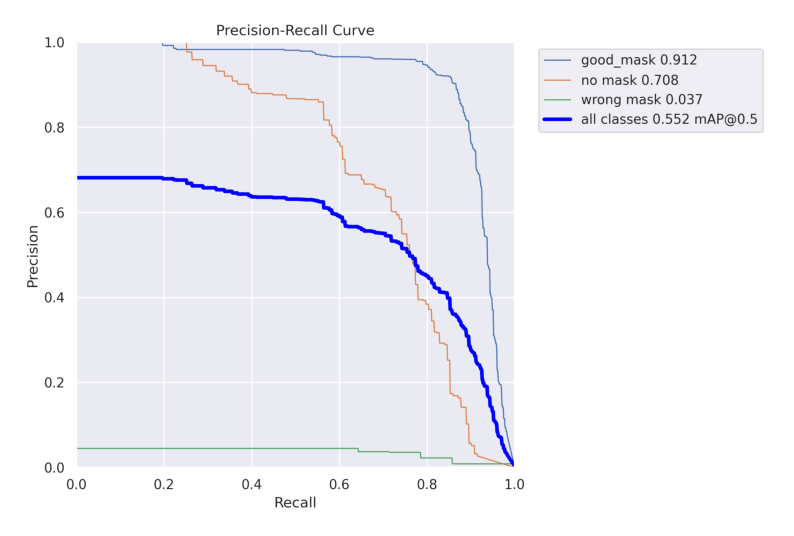

In [359]:
#map@50 확인
plt.figure(figsize=(10, 10))
image = img.imread('./runs/train/exp7/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

- mAP@0.5의 정확한 수치를 확인하기 위해 그래프를 출력합니다.
- 그래프의 라벨을 통해 mAP@0.5는 0.552임을 알 수 있습니다.
- 모델의 성능이 0.552로 높은 수치를 갖고 있어 7번 모델의 성능은 중간 정도라고 볼 수 있습니다.
- 그러나 2번 모델의 수치가 0.86이었기 때문에 현재 최적의 모델은 2번 모델입니다.

---
## 3. 객체 인식 및 시각화
아래처럼 7번의 모델 학습을 진행하였습니다. 
1. batch size 16, epochs 100
2. batch size 16, epochs 300
3. batch size 32, epochs 300
4. batch size 8, epochs 300
5. batch size 16, epochs 300, Learning rate 0.1
6. batch size 16, epochs 300, Learning rate 0.001
7. batch size 16, epochs 300, Learning rate 0.001 ~ 0.01

7개의 모델을 비교했을 때 2번 모델, `batch size는 16`, `epochs는 300`, `Learning rate는 기본 설정`인 모델이 mAP@0.5가 0.86으로 가장 좋은 성능을 보였습니다.

가장 성능이 좋은 모델인 `2번 모델`로 객체 인식 및 시각화를 합니다.

---
best model인 2번 모델의 정보를 확인합니다.

In [363]:
# best model 경로 설정
best_model_path = './runs/train/exp2/weights/best.pt'

# 모델 로드
model = torch.load(best_model_path)

# 하이퍼파라미터 정보가 담긴 opt.yaml 파일 경로
exp7_path = os.path.dirname(os.path.dirname(best_model_path))  # 상위 디렉토리로 이동
opt_path = os.path.join(exp7_path, 'opt.yaml')

# opt.yaml 파일 읽기
with open(opt_path, 'r') as file:
    opt = yaml.safe_load(file)

# 하이퍼파라미터 출력
batch_size = opt.get('batch_size', 'N/A')
epochs = opt.get('epochs', 'N/A')
learning_rate = opt.get('lr0', 'N/A')

print('Batch Size:', batch_size)
print('Epochs:', epochs)
print('Learning Rate:', learning_rate)

#exp2 model

Batch Size: 16
Epochs: 300
Learning Rate: N/A


---
객체 인식 및 시각화를 하고 결과를 출력하는 함수를 생성합니다.

1. 라이브러리
- torch: YOLOv5 모델을 로드하고 예측에 사용됩니다.
- os: 파일 및 디렉토리 경로 처리를 위해 사용됩니다.
- matplotlib.pyplot: 이미지를 출력하기 위해 사용됩니다.
- cv2 (OpenCV): 이미지 처리 및 바운딩 박스 그리기에 사용됩니다.
- matplotlib.image: 이미지를 읽기 위해 사용됩니다.


2. 이미지 및 라벨 파일 로드
- 이미지 파일과 라벨 파일은 각각 ./../data/test/images/와 ./../data/test/labels/ 디렉토리에서 가져옵니다.
- 디렉토리에서 .png 확장자의 이미지 파일과 .txt 확장자의 라벨 파일을 필터링합니다.

3. 사람 수 확인
- 라벨 파일을 열어 각 라인의 수를 세어 이미지 속 사람의 수를 확인합니다.
- 이 정보는 라벨 파일에서 제공되며, 라벨 파일의 각 라인은 이미지 속 한 사람을 나타냅니다.

4. 이미지 출력
- 선택된 이미지의 원본 파일을 열고 matplotlib 라이브러리를 사용하여 출력합니다.

5. YOLOv5 모델 로드 및 예측
- torch.hub.load를 사용하여 커스텀 YOLOv5 모델을 로드합니다.
- 선택된 이미지에 대해 모델 예측을 수행합니다.

6. 예측 결과 시각화
- 예측된 결과를 시각화하기 위해 cv2를 사용하여 바운딩 박스를 그립니다.
- 각 객체에 대해 바운딩 박스를 그리고, 객체의 클래스에 따라 라벨 텍스트를 이미지에 추가합니다. 텍스트는 아래와 같이 출력합니다.
0, good mask
1, no mask
2, wrong mask

7. 결과 출력
- 바운딩 박스와 라벨 텍스트가 추가된 이미지를 matplotlib를 사용하여 출력합니다.

In [331]:
#결과 출력 함수 생성
def show_result(num):
    # 사람 몇 명 있는지 라벨 확인
    def count_lines(file_path):
        with open(file_path, 'r', encoding='utf-8') as file:
            lines = file.readlines()
            return len(lines)
    
    # 디렉토리 경로
    directory_path1 = './../data/test/images/'
    directory_path2 = './../data/test/labels/'
    
    # 디렉토리에서 파일 목록을 가져옴
    files1 = os.listdir(directory_path1)
    files2 = os.listdir(directory_path2)
    
    # PNG 파일 필터링
    png_files = [file for file in files1 if file.lower().endswith('.png')]
    
    # 라벨 파일 필터링
    label_files = [file for file in files2 if file.lower().endswith('.txt')]
    
    # 파일이 있을 경우
    if png_files:
    
        # 사람 수 출력
        print("<원본 사진>")
        
        top_image_file = sorted(png_files)[num]
        top_label_file = sorted(label_files)[num]
        
        # 파일의 전체 경로
        image_path = os.path.join(directory_path1, top_image_file)
        label_path = os.path.join(directory_path2, top_label_file)
    
        # 사람 수 확인
        num_lines = count_lines(label_path)
    
        # 사람 수 출력
        print("이미지 속 사람 수 : ", num_lines)
    
        # 이미지 열기
        image = img.imread(image_path)
        
        # 이미지 출력
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    
        # 모델 로드
        model = torch.hub.load('ultralytics/yolov5', 'custom', path='./runs/train/exp2/weights/best.pt')
        
        # 모델을 사용하여 결과 예측
        results = model(image_path)
        
        # 검출 결과 시각화 함수
        def classify_mask(label):
            if label == 0:
                return "0, good mask"
            elif label == 1:
                return "1, no mask"
            elif label == 2:
                return "2, wrong mask"
    
        def draw_boxes(image, results):
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            for *box, conf, cls in results.xyxy[0]:
                label = classify_mask(int(cls))
                x1, y1, x2, y2 = map(int, box)
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                text = label
                text_size = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)[0]
                text_x = x1
                text_y = y1
                cv2.putText(image, text, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # 색상 순서 변환
            return image
    
        # 바운딩 박스와 레이블을 그린 이미지를 생성
        image_with_boxes = draw_boxes(image, results)
    
        # 사람 수 출력
        print("<모델 결과>")
    
        # 이미지를 출력
        plt.imshow(image_with_boxes)
        plt.axis('off')
        plt.show()
    
    else:
        print("디렉토리에 PNG 파일이 없습니다.")

---
랜덤으로 숫자를 선택하여 함수의 매개변수로 넘겨주고 결과를 확인합니다.

<원본 사진>
이미지 속 사람 수 :  1


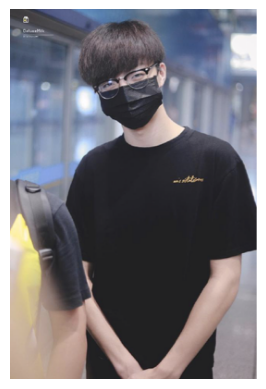

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


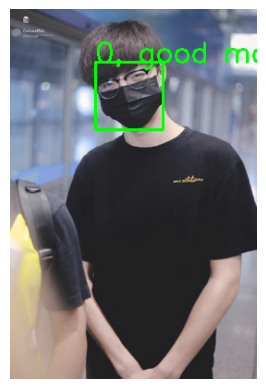

In [365]:
show_result(115)

- 위 사진은 1명이 마스크를 쓰고 있는 사진입니다. 
- 결과는 얼굴에 박스를 잘 그렸고, 0, good mask로 마스크를 잘 쓰고 있는 것으로 예측하였습니다.
- 위 케이스는 잘 예측한 케이스입니다.

1명인 사진들은 대부분 맞게 잘 예측하는 것을 볼 수 있었습니다.

<원본 사진>
이미지 속 사람 수 :  1


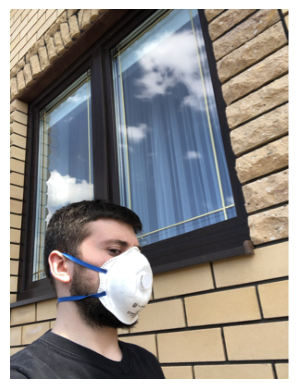

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


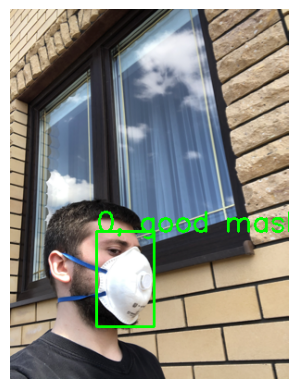

In [306]:
show_result(17)

- 위 사진도 1명이 마스크를 쓰고 있는 사진입니다. 
- 결과는 얼굴에 박스를 잘 그렸고, 0, good mask로 마스크를 잘 쓰고 있는 것으로 예측하였습니다.
- 위 케이스는 잘 예측한 케이스입니다.

1명인 사진들은 대부분 맞게 잘 예측하는 것을 볼 수 있었습니다.

<원본 사진>
이미지 속 사람 수 :  2


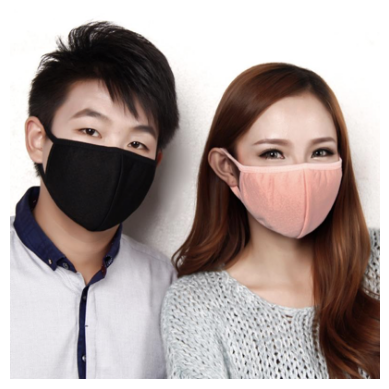

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


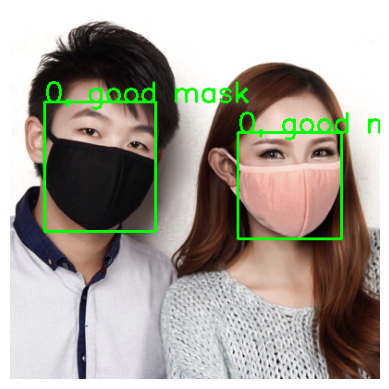

In [366]:
show_result(33)

- 원본 사진은 2명이 마스크를 쓰고 있는 사진입니다. 
- 결과는 두 명 모두 얼굴에 박스를 잘 그렸고, 0, good mask로 마스크를 잘 쓰고 있는 것으로 예측하였습니다.
- 이번 케이스는 잘 예측한 케이스입니다.

2명인 사진들도 잘 분리하여 예측하는 것을 볼 수 있었습니다.

<원본 사진>
이미지 속 사람 수 :  3


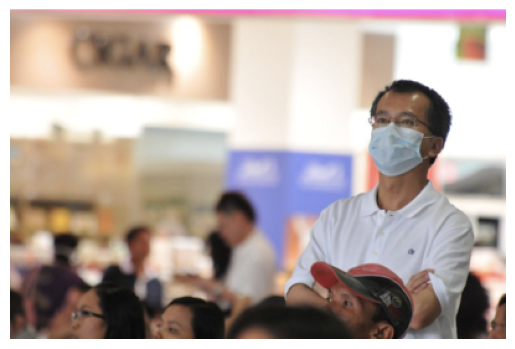

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


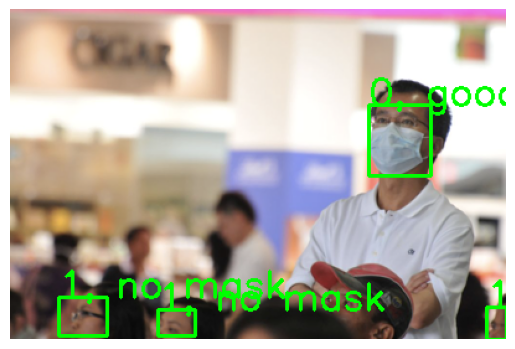

In [369]:
show_result(28)

- 원본 사진은 3명이 있는 사진입니다. 
- 결과는 한 명은 얼굴에 박스를 잘 그리고 마스크를 잘 쓰고 있는 것으로 올바른 예측을 하였으나, 아래 사람들에 대해서는 잘못된 예측을 하고 있습니다.
- 맨 왼쪽 사람의 경우 코는 보이지만 입이 보이지 않습니다. 이런 경우 마스크를 잘못 쓰고 있는 경우일 수도 있지만, 1, 마스크를 쓰지 않고 있음으로 예측하였습니다.
- 가운데 사람과 오른쪽 사람의 경우 얼굴의 3분의 1정도만 보이고 코와 입이 아예 보이지 않는데 마스크를 쓰지 않음으로 인식하였습니다. 이는 잘못 예측한 경우라고 볼 수 있습니다.

이번 케이스는 잘못 예측한 케이스라고 할 수 있습니다.

<원본 사진>
이미지 속 사람 수 :  5


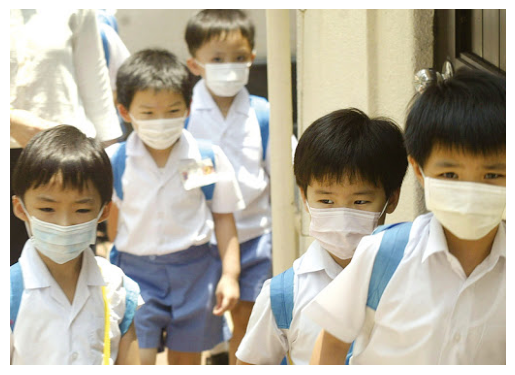

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


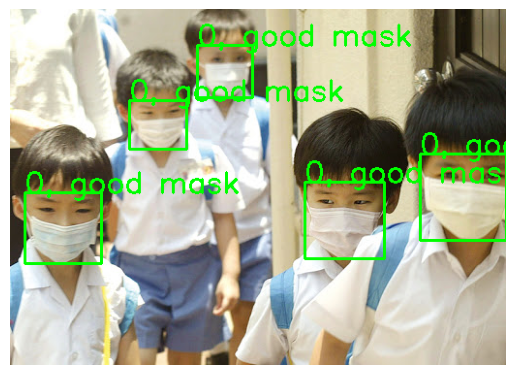

In [370]:
show_result(23)

- 원본 사진은 5명이 있는 사진입니다.
- 결과는 5명 모두 얼굴에 박스를 그리고, 마스크를 쓰고 있음으로 잘 예측하였습니다.
- 이번 케이스는 잘 예측한 케이스입니다.

여러 명이 있는 사진임에도 사람 사이의 간격있고, 사람이 잘 구분이 되어 있다면 잘 인식하는 것을 알 수 있습니다.

<원본 사진>
이미지 속 사람 수 :  1


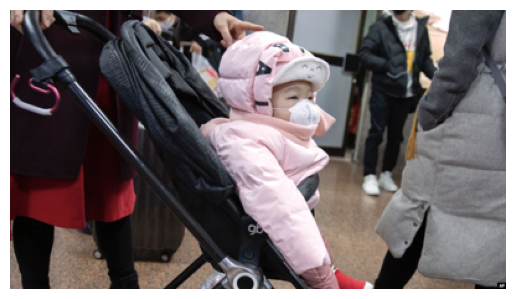

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


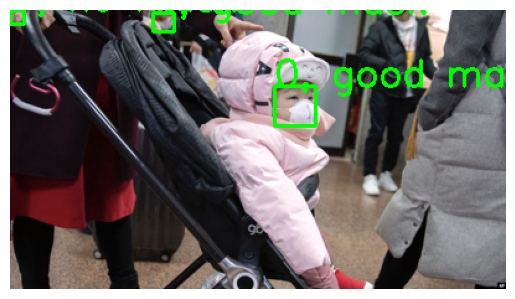

In [371]:
show_result(0)

- 원본 사진은 1명이 마스크를 쓰고 있는 사진입니다. 
- 결과는 중앙에 있는 사람은 마스크를 잘 쓰고 있다고 예측하였습니다.
- 원본 라벨링은 1명으로 되어 있지만, 모델은 3명을 인식하고 예측하였습니다. 사진의 크기가 작아 글자와 박스가 잘리지만, 잘 예측한 것으로 예상됩니다.
- 이번 케이스는 잘 예측한 케이스입니다.

<원본 사진>
이미지 속 사람 수 :  1


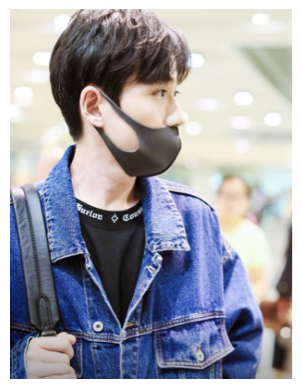

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


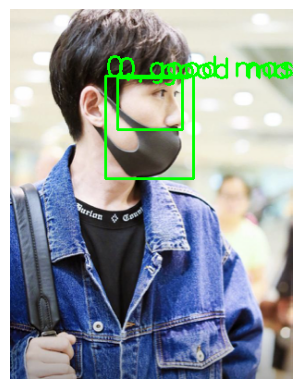

In [372]:
show_result(5)

- 원본 사진은 1명이 마스크를 잘못 쓰고 있는 사진입니다. 
- 결과는 박스를 2개 그리고 두 개 모두 0 마스크를 잘 쓰고 있음으로 예측하였습니다.
- 하지만 해당 사진은 마스크를 잘못 쓰고 있는 사진이라는 점, 그리고 사람이 한 명인데 한 명에 바운딩 박스를 그려 2명으로 인식했다는 것으로 보아 잘못 예측한 케이스라는 것을 알 수 있습니다.

이번 케이스는 잘못 예측한 케이스입니다.

<원본 사진>
이미지 속 사람 수 :  1


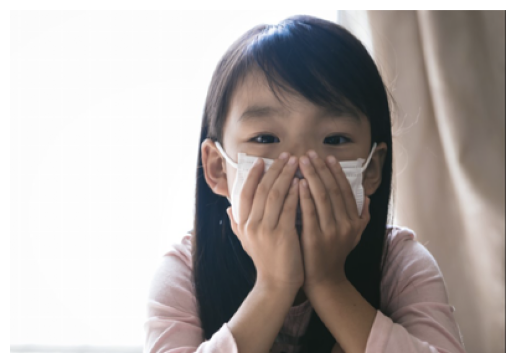

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


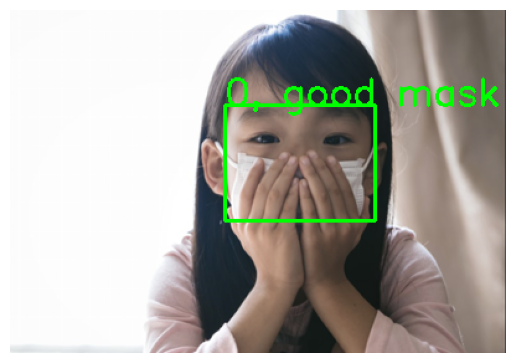

In [374]:
show_result(55)

- 원본 사진은 1명이 마스크를 쓰고 있는 사진입니다. 
- 결과는 바운딩 박스를 잘 그리고, 0 마스크를 잘 쓰고 있음으로 예측했습니다.
- 손으로 마스크를 가리고 있어 이상하게 예측할 수 있었지만, 잘 예측하였습니다.

이번 케이스는 잘 예측한 케이스이며, 다른 장애물이 있어도 잘 예측할 수 있을 정도의 성능을 갖고 있다는 것을 알 수 있습니다.

<원본 사진>
이미지 속 사람 수 :  2


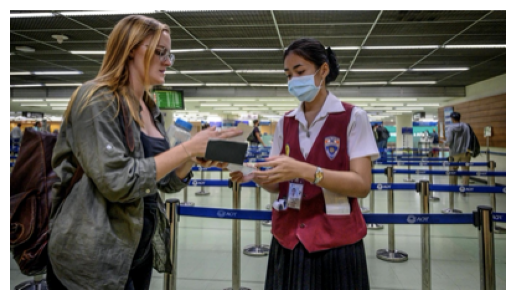

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


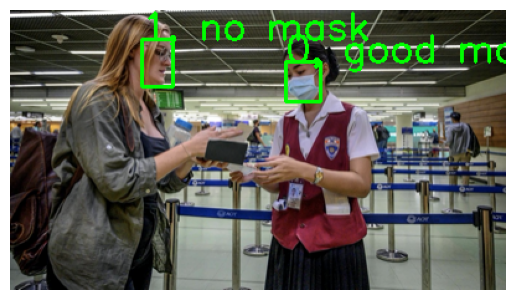

In [375]:
show_result(71)

- 원본 사진은 2명이 있는 사진입니다. 
- 결과는 두 명 모두 바운딩 박스를 잘 그렸고, 한 명은 잘 쓰고 있음, 한 명은 마스크 없음으로 예측하였습니다.
- 이번 케이스는 잘 예측한 케이스입니다.

한 명은 측면으로 있음에도 불구하고 잘 예측한 것으로 보아 높은 성능을 갖고 있다는 것을 알 수 있습니다.

<원본 사진>
이미지 속 사람 수 :  3


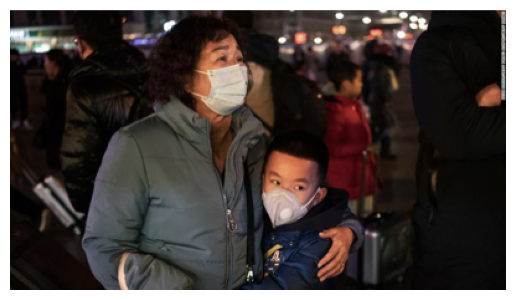

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


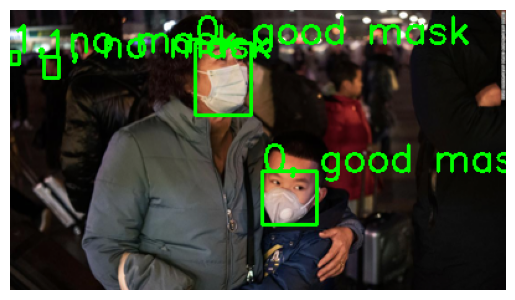

In [377]:
show_result(96)

- 원본 사진은 3명이 있는 사진입니다. 
- 결과는 4명을 인식하였고 두 명은 잘 쓰고 있음, 2명은 안 쓰고 있음으로 예측하였습니다.
- 앞 두 명과, 뒤 2명 중 오른쪽 사람은 잘 인식했다고 할 수 있습니다. 
- 뒤 중 왼쪽 사람은 1 마스크를 쓰고 있지 않음으로 인식하였지만 작고 잘 보이지 않음에도 진위 여부를 확인 할 수 없습니다. 또한, 사진을 확대를 해보아도 사람으로 보이지 않아, 잘못 예측한 것으로 생각됩니다.

이번 케이스 3명은 잘 예측하였고, 1명은 잘못 예측한 것으로 볼 수 있기 때문에 그래도 잘 예측한 케이스락 볼 수 있습니다.

<원본 사진>
이미지 속 사람 수 :  14


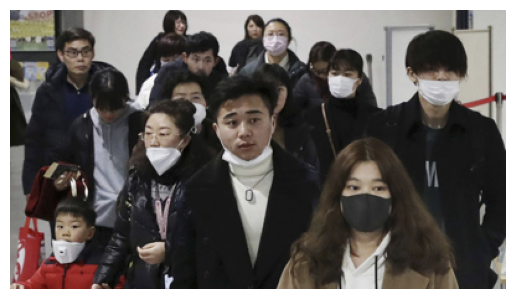

Using cache found in /home/students/cs/kk21/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<모델 결과>


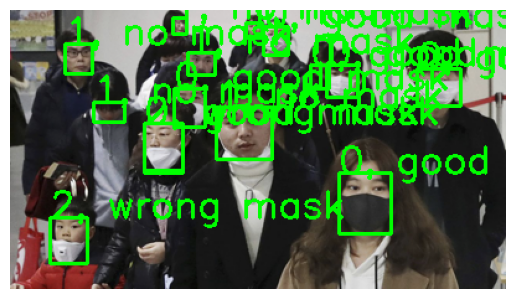

In [381]:
show_result(114)

- 원본 사진은 14명이 있는 사진입니다.
- 박스를 여러 개를 그리기는 했지만, 결과들이 겹쳐서 제대로 확인 할 수 없었습니다.

사진 중에서 몇 명의 사람을 결과를 분석해보겠습니다. 
- 먼저 왼쪽 아래 빨간 옷을 입은 아이는 마스크를 잘못 쓰고 있는 것으로 잘 예측하였습니다.
- 아이 옆에 있는 아주머니의 경우에는 마스크를 잘못 쓰고 있는 경우지만, 0 마스크를 잘 쓰고 있음과 2 마스크를 잘못 쓰고 있음으로 중복으로 예측하였습니다.

이를 통해 사람이 많은 사진이면 예측하기 어려우며, 모델의 성능에 아쉬운 부분이 있다고 생각합니다.

---
## 4. 결과 분석 및 개선 방향 제시

아래 지표를 통해 모델의 최종 성능을 평가합니다.
- Precision-Recall Curve
- mAP@50
- confusion_matrix

### 모델 평가 진행

In [333]:
#모델 평가
!python val.py --weights './runs/train/exp2/weights/best.pt' --data './../data/data.yaml' --img 640

val: data=./../data/data.yaml, weights=['./runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-324-gbb27bf78 Python-3.11.5 torch-2.2.2+cu121 CUDA:0 (Tesla T4, 14931MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /home/students/cs/kk21/ml/final/data/valid/labels.cache... 160 ima
                 Class     Images  Instances          P          R      mAP50   
                   all        160        796      0.824      0.853      0.867      0.592
             good_mask        160        619      0.908      0.931      0.951      0.665
               no mask        160        163      0.863      0.771      0.851      0.528
            wrong mask       

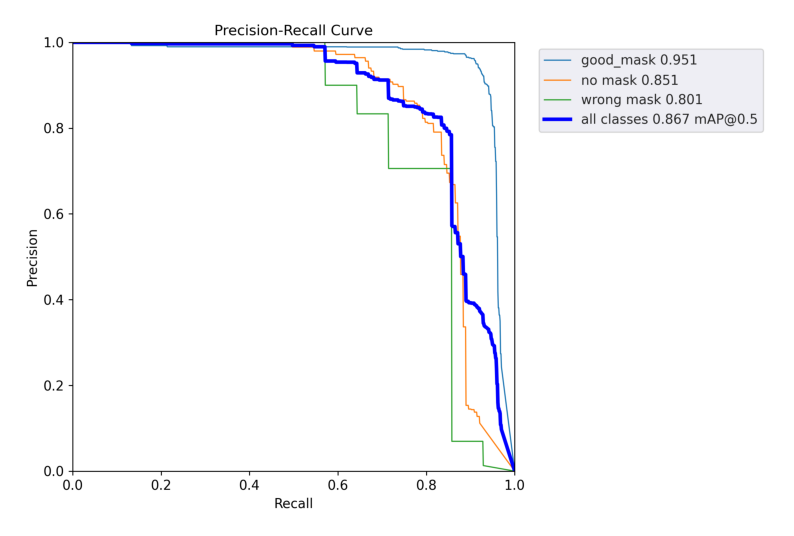

In [334]:
#그래프 확인
import matplotlib.image as img
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
image = img.imread('./runs/val/exp/PR_curve.png')
plt.imshow(image)
plt.axis('off')
plt.show()

##### 라벨에 따르면 각 선은 다음과 같은 클래스를 가집니다.
- Good Mask (연한 파란색 선): 마스크 잘 착용
- No Mask (주황색 선): 마스크 미 착용
- Wrong Mask (초록색 선): 마스크 잘 못 착용
- All Classes (굵은 파란색 선): 모든 클래스의 성능을 종합한 mAP@0.5

##### 각 클래스는 다음과 같은 값과 의미를 가집니다.
- Good Mask (0.951): 마스크를 잘 착용한 사람을 인식하고 예측하는 것을 의미하고 0.9는 높은 값이므로, 높은 precision과 recall 값을 가진다는 것을 알 수 있습니다.
- No Mask (0.851): 마스크를 착용하지 않은 사람을 인식하고 예측하는 것을 의미하고 0.851은 높은 값이므로, 높은 precision과 recall 값을 가진다는 것을 알 수 있습니다.
- Wrong Mask (0.801): 마스크를 잘 못 착용한 사람을 인식하고 예측하는 것을 의미하고 0.801는 높은 값이므로, 높은 precision과 recall 값을 가진다는 것을 알 수 있습니다.
- All Classes (0.867 mAP@0.5): mAP@0.867은 높은 값으로 전반적으로 높은 수치를 갖고 있어 좋은 성능을 보인다는 것을 알 수 있습니다.

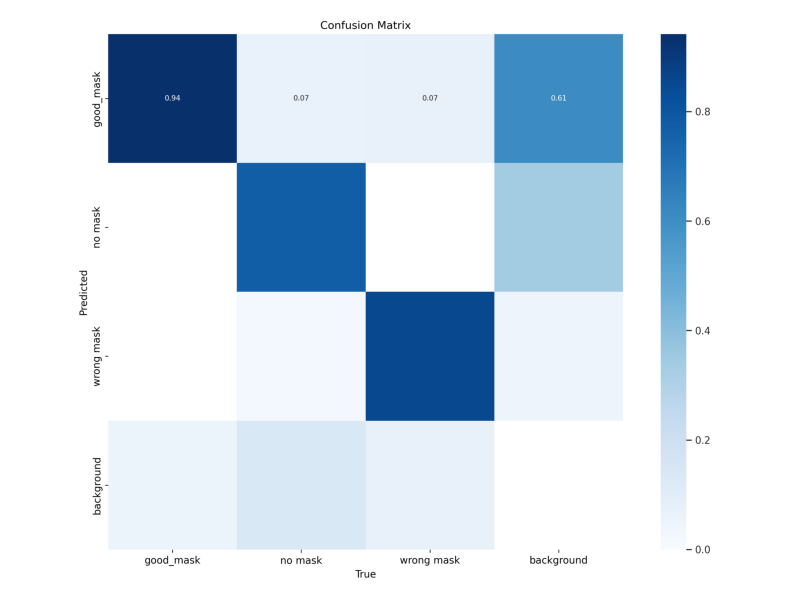

In [335]:
#그래프 확인
import matplotlib.image as img
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
image = img.imread('./runs/val/exp/confusion_matrix.png')
plt.imshow(image)
plt.axis('off')
plt.show()

1. confusion_matrix 구성 요소
- True Labels : 실제 클래스 레이블
- Predicted Labels : 모델이 예측한 클래스 레이블
- 색상 : 정확도 값


2. good_mask 분석
- 실제 마스크를 잘 쓰고 있는 것을 잘 쓰고 있음으로 예측한 것은 0.94로 높은 수치를 갖고 있습니다. 이를 통해 마스크를 잘 착용한 사진들은 잘 인식하는 것을 알 수 있습니다.
- 실제 마스크를 잘 쓰고 있는 것을 쓰고 있지 않음과 잘 못 쓰고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 두 개 모두 흰 색인 것으로 보아 쓰고 있지 않음과 잘못 쓰고 있음으로 예측하지 않은 것을 알 수 있습니다.
- 실제 마스크를 잘 쓰고 있음을 배경으로 예측한 것은 연한 하늘 색으로 몇 개는 실제 마스크를 쓰고 있는 것을 배경으로 인식한 것이 있음을 알 수 있습니다.

3. no_mask 분석
- 실제 마스크를 쓰지 않고 있는 것을 잘 쓰고 있음으로 예측한 것은 0.07로 낮은 수치를 갖고 있습니다. 이를 통해 마스크를 쓰지 않고 있는데 마스크를 쓰고 있다고 예측한 것이 조금 있다는 것을 알 수 있습니다.
- 실제 마스크를 쓰지 않고 있는 것을 쓰지 않고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 남색인 것으로 보아 약 0.8 정도의 수치를 갖고 있다고 볼 수 있습니다. 이는 올바르게 예측한 것이 0.8임을 알 수 있습니다.
- 실제 마스크를 쓰지 않고 있는 것을 잘 못 쓰고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 연한 하늘 색인 것으로 보아 0.0~0.1 사이의 수치를 갖고 있다고 볼 수 있습니다.
- 실제 마스크를 쓰지 않고 있는 것을 배경으로 예측한 것은 조금 진한 하늘 색으로 몇 개는 실제 마스크를 쓰고 있는 것을 배경으로 인식한 것이 있음을 알 수 있습니다.

4. wrong_mask 분석
- 실제 마스크를 잘못 쓰고 있는 것을 잘 쓰고 있음으로 예측한 것은 0.07로 낮은 수치를 갖고 있습니다. 이를 통해 마스크를 잘못 쓰고 있는데 마스크를 쓰고 있다고 예측한 것이 조금 있다는 것을 알 수 있습니다.
- 실제 마스크를 잘못 쓰고 있는 것을 쓰지 않고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 흰색인 것으로 보아 쓰지 않고 있음으로 예측한 것이 없다고 볼 수 있습니다.
- 실제 마스크를 잘못 쓰고 있는 것을 잘못 쓰고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 진한 남색인 것으로 보아 약 0.8 정도의 수치를 갖고 있다고 볼 수 있습니다. 이는 올바르게 예측한 것이 0.8임을 알 수 있습니다.
- 실제 마스크를 잘못 쓰고 있는 것을 배경으로 예측한 것은 연한 하늘 색으로 몇 개는 마스크를 잘못 쓰고 있는 것을 배경으로 인식한 것이 있음을 알 수 있습니다.

5. background 분석
- 배경을 잘 쓰고 있음으로 예측한 것은 0.61로 조금 높은 수치를 갖고 있습니다. 이를 통해 라벨링이 되어 있지 않은 배경에서 객체를 인식하고 마스크를 쓰고 있다고 예측한 것이 있다는 것을 알 수 있습니다. 이는 모델이 객체 인식 하는 성능이 좋다는 것을 의미합니다.
- 배경을 쓰지 않고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 연한 파란색인 것으로 보아 약 0.3 정도의 수치를 갖고 있다고 볼 수 있습니다. 이는 모델이 객체 인식 하는 성능이 좋다는 것을 의미합니다.
- 배경을 잘못 쓰고 있음으로 예측한 것은 수치는 나오지 않지만 색으로 분석할 수 있습니다. 색이 연한 하늘색인 것으로 보아 약 0.1 정도의 수치를 갖고 있다고 볼 수 있습니다. 이는 모델이 객체 인식 하는 성능이 좋다는 것을 의미합니다.

---
### 정리

#### 1. 정확도와 성능
- 해당 모델은 마스크 잘 착용 > 마스크 미 착용 > 마스크 잘 못 착용 순서로 잘 인식하고 예측하는 것을 알 수 있습니다. 
- 또한, mAP@0.5의 수치가 높은 것으로 보아 `좋은 모델`이라고 할 수 있습니다.

#### 2. 오류 사례
- 테스트 데이터로 확인했을 때는 다음과 같은 오류 사례가 있었습니다.
1. 바운딩 박스를 잘못 그리는 경우
2. 바운딩 박스를 여러 개 그리는 경우
3. 잘못 쓰고 있는 것을 안 쓰고 있다고 예측한 경우
4. 사람으로 볼 수 없지만 사람이라고 인식한 경우
- 오류가 발생하는 이유는 다음과 같다고 생각합니다.
1. 코를 눈으로 인식하는 등 신체 부위를 실제와 다르게 인식하여 마스크를 썼다고 예측한 것
2. 배경에서 사람을 인식할 때에는 배경색, 주변 사람의 존재 유무 등으로 사람을 인식한 것


#### 3. 실제 환경에서 발생할 수 있는 문제점
1. 조명 조건의 변화 : 조명에 따라 사람을 배경이라고 인식할 수 있습니다.
2. 다양한 배경 : 모델 테스트를 통해 배경을 사람으로 인식하는 경우가 있다는 것을 알 수 있습니다. 벽화와 같이 사람처럼 생긴 배경이 있다면, 이를 사람으로 잘못 인식할 수 있습니다.
3. 사진의 화질 : 실제 환경에서도 카메라로 인식하는 것이 아닌 사진으로 인식하게 되면 화질에 따라 인식을 못할 수도 있습니다.
4. 마스크 종류 : 마스크 색상 등에 대해서는 잘 인식하지만 만약, 사람이나 캐릭터가 그려진 마스크라면 2명으로 인식할 수도 있습니다.
5. 피부와 마스크 색상 : 피부와 마스크 색상이 동일하다면 잘못 인식할 수도 있습니다.

#### 4. 개선방향
1. 데이터 불균형 해결
- 이번에 사용한 데이터셋은 데이터의 불균형이 존재하는데 3개의 분류 중 마스크를 잘 쓰고 있는 사진의 비율이 많습니다.
- 이를 해결하기 위해 마스크를 잘못 쓰고 있는 사진과 마스크를 잘 쓰고 있는 사진의 수를 늘려 두 케이스의 학습을 늘려 개선할 수 있습니다.

2. 다양한 데이터 사용
- 캐릭터가 그려진 마스크나, 다양한 마스크 색상을 가진 데이터를 추가하여 학습하면 모델 성능을 개선할 수 있습니다.
- 여러 배경을 가진 데이터를 활용하면 모델 성능을 개선할 수 있습니다.

3. 여러 화질 데이터 사용
- 동일한 사진을 화질을 낮추어 학습해보는 것도 모델의 성능을 올릴 수 있는 방법입니다.